# Neural Style Transfer using VGG-19 pre-trained network

## 1 - Packages
All necessary packages and dependencies to perform Neural Style Transfer.

In [7]:
import keras
import os
import scipy.io
import scipy.misc
import sys
import pprint
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from matplotlib.pyplot import imshow
from PIL import Image
from tensorflow.python.framework.ops import EagerTensor
%matplotlib inline

## 2 - Problem Statement
Neural Style Transfer (NST) is one of the most fun and interesting optimization techniques in the deep learning. It merges two images, namely: a "content" image (C) and "style" image (S), to create a "genrated" image (G). The generated image G combines the "content" of the image C with the "style" of image S.

In the assignment, the Louvre museum in Paris (content image C) will be combined with the impressionist style of the Claude Monet (content image S) to denerate the following Image:

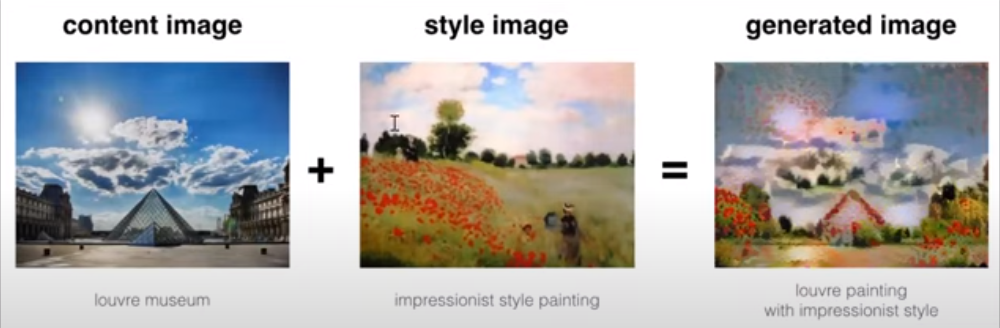

## 3 - Transfer Learning

Neural Style Tansfer (NST) uses a previously trained convolutional network, and builds on top of that. The idea of using a network trained on a diferent task and applying it to a new task is called transfer learning.

Here is used an epynomously named VGG network from an NST paper published by the Visual Geomtry Group at University of Oxford in 2023. Specifically, VGG-19 is ussed, a 19-laer version of the VGG network. This model has already been trained on the very large ImageNet database, and has learned to recognize a variety of low level features (at the shallower layer) and high level features (at the deeper layers).

The following code is to load parameters from the VGG model. This may take a few seconds.

In [8]:
tf.random.set_seed(272)  # DO NOT CHANGE THIS VALUE

pp = pprint.PrettyPrinter(indent=4)
img_size = 400

vgg = keras.applications.VGG19(
    include_top=False, input_shape=(img_size, img_size, 3), weights="imagenet"
)  # top layer is not included, otherwise input shape can be only (224, 224, 3)
vgg.trainable = False  # non-trainable weights

pp.pprint(vgg)

In [9]:
vgg.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 400, 400, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 400, 400, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 400, 400, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 200, 200, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 200, 200, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 200, 200, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 100, 100, 128)     0     

## 4 - Neural Style Transfer (NST)
Neural Style Transfer (NST) algorithm is built in three steps:
* First, the content cost function $J_{content}(C,G)$
* Second, the style cost function $J_{style}(C,G)$
* Third, they are put all together to get $J(G)=\alpha J_{content}(C,G) + \beta J_{style}(S,G)$

### 4.1 - Computing the Content Cost

#### 4.1.1 - Make Generated Image G Match the Content of Image C
One goal to achieve when performing NST is that the content of the generated G image matches the content of the C image. To do so, it's required an understanding of __shallow versus deep layers__:
* The shallower layers of a ConvNet tend to detect lower-level features such as _edges and simple textures_.
* The deeper layers tend to detect higher-level features such as more _complex textures and object classes_.

#### Choose a "middle" activation layer $a^{[l]}$:
It's needed the "generated" image G to have similar content as the input image C. Some layer's activations shuld be chosen to repesent the content of an image.
* Practivally, the most visually pleasing results will be obtained if a layer in the __middle__ of the network will be chosen, neither too shallow nor too deep. This ensures that the network detects both higher-level and lower-level features.
* Also, it's possible to experiment with diffrent layers to see how the result vary.

#### Forward propagate image "C":
* Set the image C as the input to the pretrained VGG network and run forward propagation.
* Let $a^{(C)}$ be the hidden layer activations in the layer you chosen. This will be an $n_H \times n_W \times n_C$ tensor.

#### Forward propagate image "G":
* Repeat this process with the image G: set G as the input and run forward propagation.
* Let $a^{(G)}$ be the corresponding hidden layer activation.

In this running example, the content image C will be the picture of the Louvre Museum in Paris as shown below.

The content image (C)


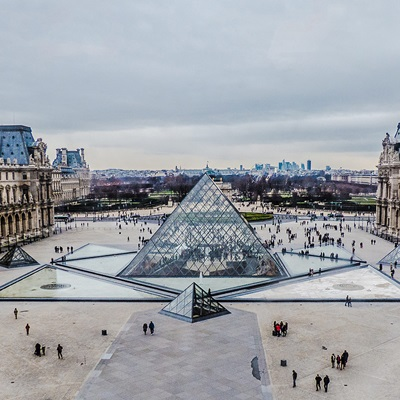

In [10]:
content_image = Image.open("img/louvre.jpg")
print("The content image (C)")
content_image

#### 4.1.2 - Content Cost Function $J_{content}(C,G)$
To achieve the content of the generated G image matches the content of the C image, it's needed to calculate the content cost function, which is be defined as:

$$J_{content}(C,G)=\frac{1}{4 \times n_H \times n_W \times n_C}\ \sum_{all \space entries}(a^{(C)} - a^{(G)})^2$$

* Here, $n_H$, $n_W$ and $n_C$ are the height, width and number of channels of the hidden layer that was chosen and appears in a normalization term in the cost.
* $a^{(C)}$ and $a^{(G)}$ are the 3D volumes corresponding to a hidden layer's activation.
* In order to compute the cost $J_{content}(C,G)$, it might be convenient to unroll these 3D volumes into a 2D matrix, as shown below.
* Technically this unrolling step isn't needed to compute $J_{content}$, but it will be good practice for when will be needed to carry out a similar operation later for computing the cost $J_{style}$.

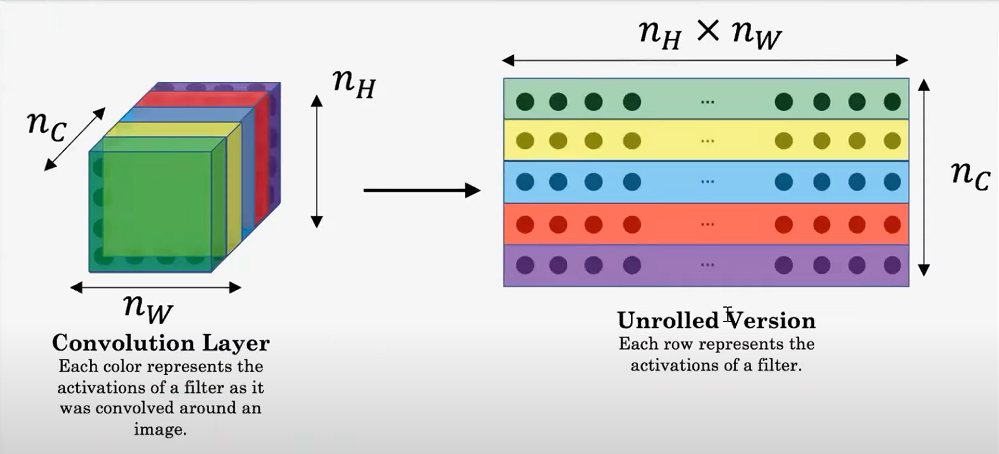

### Exercise 1 - compute_content_cost
Compute the "content cost" using TensorFlow.

__Instructions:__

`a_G`: hidden layer activations representing content of the image G
`a_C`: hidden layer activations representing content of the image C

The 3 steps to implement this function are:
1. Retrieve dimensions from `a_G`:
    * To retrieve dimensions from a tensor `x`, use `x.get_shape().as_list()`.
2. Unroll `a_C` and `a_G` as explained in the picture above
    * Can be done using the functions: `tf.transform` and `tf.reshape`.
3. Compute the content cost:
    * Can be done using the functions: `tf.reduce_sum`, `tf.square` and `tf.subtract`.

Additional Hints for "Unrolling":
* To unroll the tensor, the shape $(m, n_H, n_W, n_C)$ should be changed to $(m, n_H \times n_W, n_C)$.
* `tf.reshape(tensor, shape)` takes a list of integers that represents the desired output shape.
* For the `shape` parameter, a `-1` tells the function to choose the correct dimension size so that the output tensor still contains all the values of the original tensor.
* So `tf.reshape(a_C, shape=[m, n_H * n_W, n_C])` gives the same result as `tf.reshape(a_C, shape=[m, -1, n_C])`.
* If necessary to re-order the dimensions, can be used `tf.transpose(tensor, perm)`, where `perm` is a list of integers containing the original index of the dimensions.
* For example, `tf.transpose(a_C, perm=[0,3,1,2])` changes the dimensions from $(m, n_H, n_W, n_C)$ to $(m, n_C, n_H, n_W)$.
* Note that it's not necessarily needed `tf.transpose` to 'unroll' the tensors in this case but this is a useful function to practice and understand other situations to be encountered.

Graded function to compute content cost

In [13]:
def compute_content_cost(content_output, generated_output):
    """
    Computes the content cost

    Arguments:
    a_C -- tensor of dimention (1, n_H, n_W, n_C), hidden layer activation representing content of the image C
    a_G -- tensor of dimention (1, n_H, n_W, n_C), hidden layer activation representing content of the image G

    Returns:
    J_content -- scalar to be computed using equation 1 above
    """
    a_C = content_output[-1]
    a_G = generated_output[-1]

    # Retrieve dimensions from a_G
    m, n_H, n_W, n_C = a_G.get_shape().as_list()

    # Reshape a_C and a_G (=2 lines)
    a_C_unrolled = tf.transpose(tf.reshape(a_C, shape=[m, -1, n_C]))
    a_G_unrolled = tf.transpose(tf.reshape(a_G, shape=[m, -1, n_C]))

    # Compute the cost with tensorflow
    J_content = (1 / (4 * n_H * n_W * n_C)) * tf.reduce_sum(tf.square(tf.subtract(a_C_unrolled, a_G_unrolled)))

    return J_content

In [14]:
tf.random.set_seed(1)
a_C = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
a_G = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
J_content = compute_content_cost([a_C], [a_G])
J_content_0 = compute_content_cost([a_C], [a_C])

assert type(J_content) == EagerTensor, "Use the tensorflow function"
assert np.isclose(J_content_0, 0.0), "Wrong value, compute_content_cost(A, A) must be 0"
assert np.isclose(J_content, 7.0568767), f"Wrong value, expeced (7.0568767), curent{J_content}"

print("J_conent = " + str(J_content))

# Test that it works with symbolik tensors
ll = keras.layers.Dense(8, activation="relu", input_shape=(1, 4, 4, 3))
model_tmp = keras.models.Sequential()
model_tmp.add(ll)
try:
    compute_content_cost(ll.output, ll.output)
    print("\033[92mAll tests passed")
except Exception as inst:
    print("\n\033[92mDon't use the numpy API iside compute_content_cost\n")
    print(inst)

J_conent = tf.Tensor(7.0568767, shape=(), dtype=float32)
All tests passed


__Expected Output:__

`J_conent = 7.0568767`

__Remember:__
* The content cost takes a hidden layer activation of the neural network and measures how different $a^{C}$ and $a^{G}$ are.
* This will help to make sure $G$ has similar content as $C$ for minimizing of the content cost later.

### 4.2 - Computin the Style Cost
For the running examle the following style image will be used

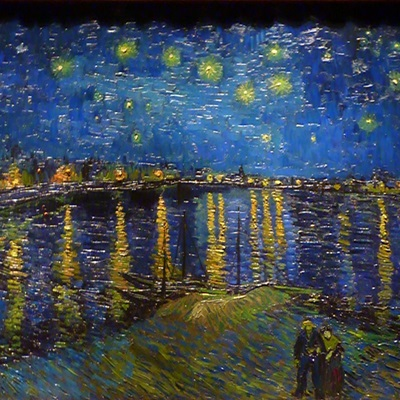

In [15]:
example = Image.open("img/impress.jpg")
example

#### 4.2.1 - Style Matrix
Gram matrix
* The style matrix is also called a "Gram matrix".
* In linear algebra, the Gram matrix G of a set of vectors $(v_1,...,v_n)$ is the matrix of dot products, whose entries are $G_{ij}=v_i^Tv_j=np.dot(v_i,v_j)$.
* In other words, $G_{ij}$ compares how similar $v_i$ is to $v_j$: if they are highly similar, they should have large dot product, and thus for $G_{ij}$ to be larger.

Two meanings of the variable G
* Note that there is an unfortunate collision in the variable names used here. Following the common terminology used in the literature:

    * $G$ is used to denote the Style matrix (or Gram matrix);
    * $G$ also denotes the generaed image.
* For the sake of clarity, in this assignment $G_{gram}$ will be used to refer to the Gram matrix, and $G$ to denote the generated image.

Compute Gram matrix $G_{gram}$
The Style matrix will be computed by multiplying the "unrolled" filter matrix with its transpose:

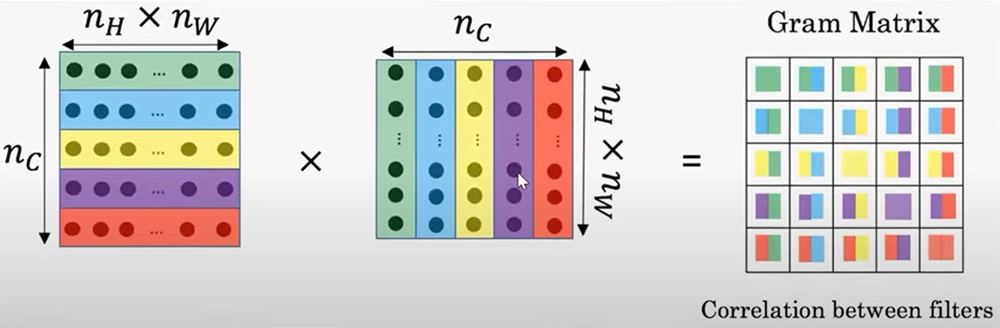

$$G_{gram}=A_{unrolled}A_{unrolled}^T$$
$G_{(gram)ij}$: correlation

The result is a matrix of dimension $(n_C, n_C)$ where $n_C$ is the number of filters (channels). The value $G_{(gram)ij}$ measure how similar the activations of filter $i$ are to the activations of filter $j$.

$G_{(gram)ii}$: prevalence of patterns or textures

* The diagonal elements $G_{(gram)ii}$ measure how "active" a filter $i$ is.
* For example, suppose filter $i$ is detecting vertical textures in the image. Then $G_{(gram)ii}$ measures how common vertical textures are in the image as a whole.
* If $G_{(gram)ii}$ is large, this means that the image has a lot of vertical textures.

By capturing the prevalence of different types of features ($G_{(gram)ii}$), as well as how much different features occur together ($G_{(gram)ij}$), the Style matrix $G_{gram}$ measures the style of an image.

#### Exercise 2 - gram_matrix
* A function that computes the Gram matrix of a matrix A is impleneted using TensorFlow.

    * The formula is: the Gram matrix of A is $G_A=AA^T$.
    
* These functions are used: `matmul` and `transpose`.

Graded function to compute Gram matrix

In [17]:
def gram_matrix(A):
    """
    Arguments:
    A -- matrix of shape (n_C, n_H*n_W)

    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """

    GA = tf.matmul(A, A, transpose_b=True)

    return GA

In [18]:
tf.random.set_seed(1)
A = tf.random.normal([3, 2 * 1], mean=1, stddev=4)
GA = gram_matrix(A)

assert type(GA) == EagerTensor, "Use the tensorflow function"
assert GA.shape == (3, 3), "Wrong shape, check the order of the matmul parameters"
assert np.allclose(GA[0,:], [63.1888, -26.721275, -7.7320204]), "Wrong values"

print("GA = \n" + str(GA))

print("\033[92mAll tests passed")

GA = 
tf.Tensor(
[[ 63.1888    -26.721275   -7.7320204]
 [-26.721275   12.76758    -2.5158243]
 [ -7.7320204  -2.5158243  23.752384 ]], shape=(3, 3), dtype=float32)
All tests passed


__Expected Output:__

`GA = [[ 63.1888    -26.721275   -7.7320204] [-26.721275   12.76758    -2.5158243] [ -7.7320204  -2.5158243  23.752384 ]]`

### 4.2.2 - Style Cost
Next goal is to minimize the distance between the Gram matrix of the "style" image S and the Gram matrix of the "generated" image G.
* For now, only a single hidden layer $a$ will br used.
* The corresponding style cost for this layer is defined as:
$$J_{style}^{[l]}(S,G)=\frac{1}{4 \times n_C^2 \times (n_H \times n_W)^2} \sum_{i=1}^{n_C} \sum_{j=1}^{n_C}(G_{(gram)ij}^{(S)} - G_{(gram)ij}^{(G)})^2$$
* $G_{gram}^{(S)}$ - Gram matrix of the "style" image.
* $G_{gram}^{(G)}$ - Gram matrix of the "generated" image.
* Remember that this cost is computed using the hidden layer activations for a particular hidden layer in the network $a_{[l]}$

### Exercise 3 - compute_layer_style_cost
Compute the style cost for a single layer.
__Instructions__: 4 steps to implement this function are:
1. Retrieve dimensions from the hidden layer activations $a_G$:

    * To retrieve dimensions from a tensor X, use: `x.get_shape().as_list()`
2. Unroll the hidden layer activations $a_S$ and $A_G$ into 2D matrices, as explained in the picture above (see the images in the sections "computing the content cost" and "style matrix").

    * Can be used `tf.transpose` and `tf.reshape`.
3. Compute the Style matrix of the images S and G.
4. Compute the Style cost:

Additional Hints
* Since the activation dimensions are ($m, n_H, n_W, n_C$) whereas the desired unrolled matrix shape is ($n_C, n_H \times n_W$), the order of the filter dimension $n_C$ is changed. So, `tf.transpose` can be used to change the order of the filter dimension.

Graded function to compute layer style cost

In [19]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimensions (1, n_H, n_W, n_C), hidden layer activations representing style of the image S
    a_G -- tensor of dimensions (1, n_H, n_W, n_C), hidden layer activations representing style of the image G

    Returns:
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation Jstyle(S,G)
    """
    # Retrieve dimensions from a_G
    m, n_H, n_W, n_C = a_G.get_shape().as_list()

    # Reshape the image from (n_H * n_W, n_C) to have them of shape (n_C, n_H * n_W)
    a_S = tf.transpose(tf.reshape(a_S, shape=[-1, n_C]))
    a_G = tf.transpose(tf.reshape(a_G, shape=[-1, n_C]))

    # Computing gram_matrices for both images S and G
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    # Computing the loss
    J_style_layer = (1 / (4 * n_C**2 * (n_H * n_W)**2)) * tf.reduce_sum(tf.square(tf.subtract(GS, GG)))

    return J_style_layer

In [20]:
tf.random.set_seed(1)
a_S = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
a_G = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
J_style_layer_GG = compute_layer_style_cost(a_G, a_G)
J_style_layer_SG = compute_layer_style_cost(a_S, a_G)

assert type(J_style_layer_GG) == EagerTensor, "Use the tensorflow function"
assert np.isclose(J_style_layer_GG, 0.0), "Wrong value, compute_layer_style_cost(A, A) must be 0"
assert J_style_layer_SG > 0, "Wrong value, compute_layer_style_cost(A, B) must be greater than 0 if A != B"
assert np.isclose(J_style_layer_SG, 14.017805), "Wrong value"

print("J_style_layer = " + str(J_style_layer_SG))

# Test that it works with symbolic tensors
ll = keras.layers.Dense(8, activation="relu", input_shape=(4, 4, 3))
model_tmp = keras.models.Sequential()
model_tmp.add(ll)
try:
    compute_layer_style_cost(ll.output, ll.output)
    print("\033[92mAll tests passed")
except Exception as inst:
    print("\n\033[92mDon't use the numpy API iside compute_layer_style_cost\n")
    print(inst)

J_style_layer = tf.Tensor(14.017806, shape=(), dtype=float32)
All tests passed


__Expected Output:__

`J_style_layer = 14.017805`

### 4.2.3 - Style Weighs
* So far only the style from layer was captured.
* Better results can be obtained if "merge" style costs from several different layers.
* Each layer will be given weights ($\lambda^{[l]}$) that reflect how much each layer will contribute to the style.
* It's possible to experiment with different weights to see how it changes the generated image $G$.
* By default, each layer gets equal weight and the weights add up to 1. ($\sum_{l}^{L}\lambda^{[l]}=1$)

Start by listing the layer names:

In [21]:
for layer in vgg.layers:
    print(layer.name)

input_3
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


Later a layer `block5_conv4` will be defined as the content layer, which represents the image.

In [22]:
vgg.get_layer("block5_conv4").output

<KerasTensor: shape=(None, 25, 25, 512) dtype=float32 (created by layer 'block5_conv4')>

Now the layers should be chosen to represent the style of the image and assign style cost:

In [23]:
STYLE_LAYERS = [
    ("block1_conv1", 0.2),
    ("block2_conv1", 0.2),
    ("block3_conv1", 0.2),
    ("block4_conv1", 0.2),
    ("block5_conv1", 0.1),
    ("block5_conv3", 0.1),
]

The style costs for different layers can be combined as follows:

$$J_{style}(S,G)=\sum_{l} \lambda^{[l]} J_{sryle}^{[l]}(S,G)$$

where the values for $\lambda^{[l]}$ are given in `STYLE_LAYERS`.

#### Exercise 4 - compute_style_cost
Compute style cost

__Instructions:__
* The compute_style_cost(...) function has already been implemented.
* It calls `compute_layer_style_cost(...)` several times and weights their results using the values in `STYLE_LAERS`.

Description of `compute_style_cost`

For each layer:
* Select the activation (the output tensor) of the corrent layer.
* Get the style of the style image "S" from the current layer.
* Get the style of the generated image "G" from the current layer.
* Compute the "style cost" for the current layer.
* Add the weighted style cost to the overall style cost ($J_{style}$)

Once this is done:
* Return the overall style cost.

In [24]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overal style cost from several chosen layers

    Arguments:
    style_image_output -- tensorflow model
    generated_image_output --
    STYLE_LAYERS -- a python list containing:
                        - the names of the layers for style extraction
                        - a coefficient for each of them

    Returns:
    J_style -- tensor representing a scalar value, style cost defined by equation Jstyle(S,G)
    """
    # Initialize the overall syle cost
    J_style = 0
    
    # Set a_S to be the hidden layer activation from the layer that was selected
    # The last element from the array contains the content layer image, which must not to be used
    a_S = style_image_output[:-1]

    # Set a_G to be the output of the choosen hidden layers
    # The last element from the array contains the content layer image, which must not to be used
    a_G = generated_image_output[:-1]
    
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):
        # Compute style cost or the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        # Add weight * J_style_layer of this layer to overall style cost
        J_style += weight[1] * J_style_layer
    
    return J_style

How to choose coefficient for each layer? The deeper layers capture higher-level concepts, and the features in the deeper layers are less localized in the image relative to each other. So, if required the generated image to softly follow the style image, try choosing larger weights for deeper layers and smaller weights for the first layers. In contrast, if required the generated image to strongly follow the style image, try choosing smaller weights for deeper layers and larger weights for the first layers.

__What to remember:__
* The style of an image can be represented using the Gram matrix of a hidden layer's activations.
* Even better result could be obtained by combining this representation from multiple different layers.
* This is in contrast to the content representation, where usually using just a single hidden layer is sufficient.
* Minimizing the style cost will cause the image $G$ to follow the style of the image $S$.

### 4.3 - Defining the Total Cost to Optimize
Cost function that minimizes both the style and the content cost. The formula is:
$$J(G)=\alpha J_{content}(C,G) + \beta J_{style}(S,G)$$

#### Exercise 5 - total_cost
Implementation of the total cost function which includes both the content cost and the style cost.

Graded function of the total cost

In [25]:
@tf.function()
def total_cost(J_content, J_style, alpha=10, beta=40):
    """
    Computes the total cost function

    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost

    Retuns:
    J -- total cost as defined by the formula above
    """

    J = alpha * J_content + beta * J_style

    return J

In [26]:
J_content = 0.2
J_style = 0.8
J = total_cost(J_content, J_style)

assert type(J) == EagerTensor, "Do not remove the @tf.function() modifier from the function"
assert J == 34, "Wrong value, try inverting the order of alpha and beta in the J calculation"
assert np.isclose(total_cost(0.3, 0.5, 3, 8), 4.9), "Wrong value, use the alpha and beta parameters"

np.random.seed(1)
print("J = " + str(total_cost(np.random.uniform(0, 1), np.random.uniform(0, 1))))

print("\033[92mAll tests passed")

J = tf.Tensor(32.9832, shape=(), dtype=float32)
All tests passed


__Expected Output:__

`J = 32.9832`

__What to remember:__
* The total cost is a linear combination of the content cost $J_{content}(C,G)$ and the style cost $J_{style}(S,G)$
* $\alpha$ and $\beta$ are hyperparameters that control the relative weighting between content and style.

## 5 - Solving the Optimization Problem

Implementation of the Neural Style Transfer.

What the program is able to do:
1. Load the content image
2. Load the style image
3. Randomly initialize the image to be generated
4. Load the VGG19 model
5. Compute the content cost
6. Compute the style cost
7. Compute the total cost
8. Define the optimizer and learning rate

Here are the individual steps in detail.

### 5.1 - Load the Content Image
Run the following code cell to load, reshape and normalize the "content" image C (the Louvre museum picture):

(1, 400, 400, 3)


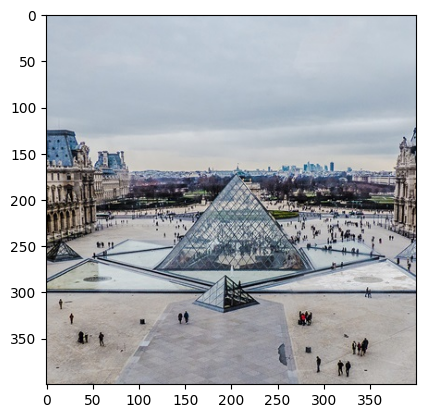

In [27]:
content_image = np.array(Image.open("img/louvre.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

### 5.2 - Load the Style Image
Now load, reshape and normalize the "style" image (impressionist painting):

(1, 400, 400, 3)


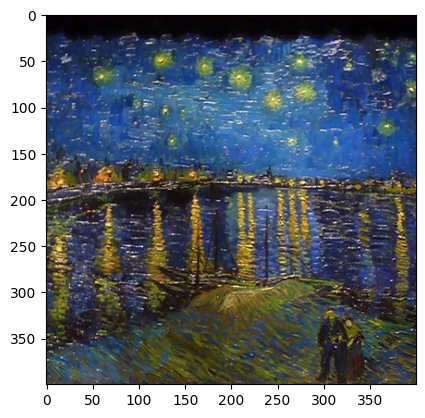

In [28]:
style_image = np.array(Image.open("img/impress.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

### 5.3 - Randomly Initialize the Inage to be Generated
Now initialize the "generated" image as a noisy image created from the content_image.
* The generated image is slightly correlated with the content image.
* By initializing the pixels of the generated image to be mostly noise but slightly correlated with the content image, this will help the content of the "generated" image more rapidly match the content of the "content" image.

(1, 400, 400, 3)


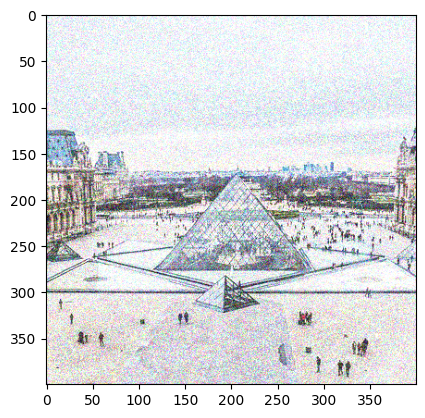

In [29]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), 0, 0.5)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

### 5.4 - Load Pre-Trained VGG19 Model
Define a function, which loads the VGG19 model and returns a list of the outputs for the middle layers.

In [33]:
def get_layer_outputs(vgg, layer_names):
    """Creates a vgg model that returns a list of intermediate output values"""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = keras.Model([vgg.input], outputs)
    return model

Define the content layer and build the model.

In [34]:
content_layer = [("block5_conv4", 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

Save the outputs for the content and style layers in separate variables.

In [35]:
content_target = vgg_model_outputs(content_image) # Content encoder
style_targets = vgg_model_outputs(style_image) # Style encoder

### 5.5 - Compute Total Cost

#### 5.5.1 - Compute Content Cost
To compute the content cost, `a_C` and `a_G` should be assigned to be the appropriate hidden layer activations.
The layer `block5_conv4` will be used to compute the content cost. The code below does the following:
1. Set a_C to be the tensor giving the hidden layer activation for the layer `block5_conv4`.
2. Set a_G to be the tensor giving the hidden layer activation for the same layer.
3. Compute the content cost using a_C and a_G.

In [36]:
# Assign the content image to be the input of the VGG model
# Set a_C to be the hidden layer activation from the layer that was selected
preprocessed_content = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

# Set a_G to be the hidden layer activation from the same layer. Here, a_G references model["conv4_2"]
# and isn't evaluated yet. Later in the code, the image G will be assigned as the model input
a_G = vgg_model_outputs(generated_image)

# Compute the content cost
J_content = compute_content_cost(a_C, a_G)

print(J_content)

tf.Tensor(0.003875864, shape=(), dtype=float32)


### 5.5.2 - Compute Style Cost
The code below sets a_S to be the tensor giving the hidden layer activation for `STYLE_LAYERS`.

In [37]:
# Assign the input of the model to be the "style" image
preprocessed_style = tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

# Compute the style cost
J_style = compute_style_cost(a_S, a_G)
print(J_style)

tf.Tensor(750.22064, shape=(), dtype=float32)


Below are the units that are needed to display the images generated by the style transfer model.

In [43]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1

    Arguments:
    image -- tensor

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

In [44]:
def tensor_to_image(tensor):
    """
    Convert the given tensor into a PIL image

    Arguments:
    tensor -- Tensor

    Returns:
    Image: a PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

#### Exercise 6 - train_step
Implementation of the train_step() function for the transfer learning
* Use the Adam optimizer to minimize the total cost `J`.
* Use a learning rate of 0.03.
* Use `tf.GradientTape` to update image.
* Within the tf.GradientTape():
    * Compute the encoding of the generated image using vgg_model_outputs
    * Compute the total cost J, using the variables a_C, a_S and a_G
    * Use `alpha = 10` and `beta = 40`.

Graded function to train gradient step

In [45]:
optimizer = keras.optimizers.Adam(learning_rate=0.03)

@tf.function()
def train_step(generated_image):
    with tf.GradientTape() as tape:
        # In this function the precomputed encoded images a_S and a_C are used.
        # Compute a_G as the vgg_model_outputs for the current generated image.

        a_G = vgg_model_outputs(generated_image)

        # Compute the style cost
        J_style = compute_style_cost(a_S, a_G)
        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)
        # Compute the total cost
        J = total_cost(J_content, J_style)

    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
    # For grading purposes
    return J

In [46]:
# Always run the last cell before this one or will get an error if not!!!
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))

J1 = train_step(generated_image)
print(J1)
assert type(J1) == EagerTensor, f"Wrong type {type(J1)} != {EagerTensor}"

J2 = train_step(generated_image)
print(J2)

print("\033[92mAll tests passed")

tf.Tensor(26823.715, shape=(), dtype=float32)
tf.Tensor(16637.588, shape=(), dtype=float32)
All tests passed


__Expected Output:__

`tf.Tensor(26823.715, shape=(), dtype=float32)`

`tf.Tensor(16637.588, shape=(), dtype=float32)`

Now it's needed to put it all together into one function to better see the results.

### 5.6 - Train the Model
Run the following cell to generate an artistic image. It should take about 3 min on a GPU for 2500 iterations. Neural Style Transfer is generally trained using GPUs.

If inscreasing the learning rate, it's possible to speed up the style transfer, but often at the cost of quality.

Epoch 0 


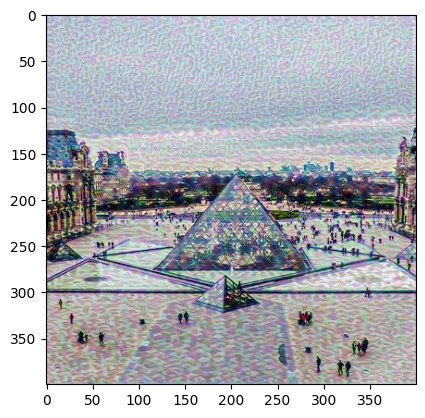

Epoch 250 


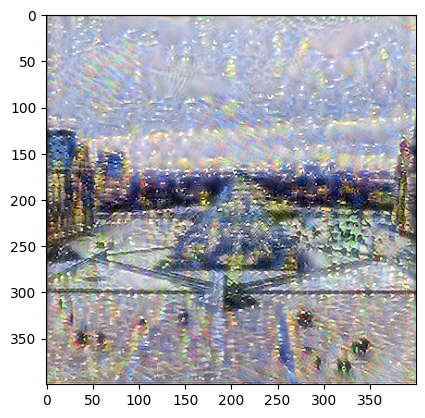

Epoch 500 


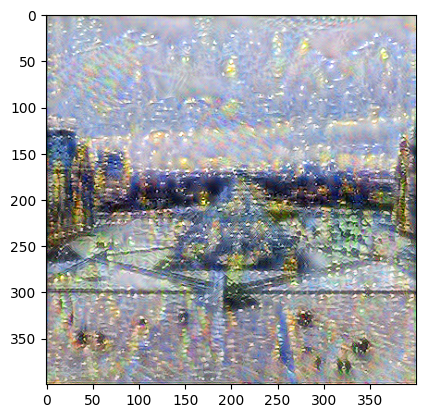

Epoch 750 


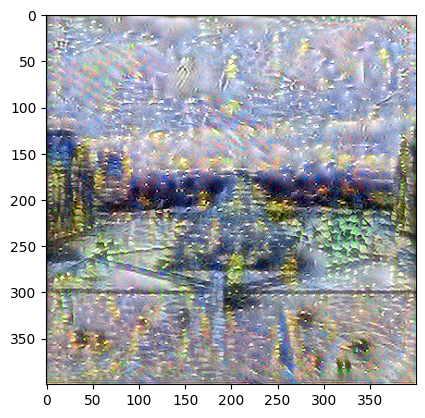

Epoch 1000 


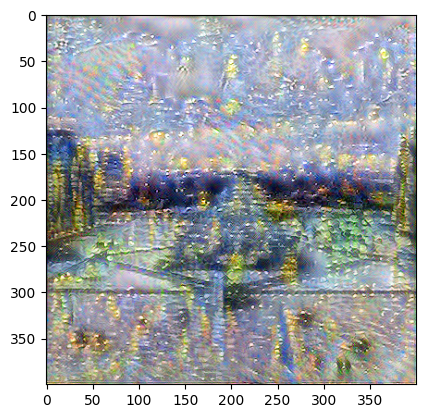

Epoch 1250 


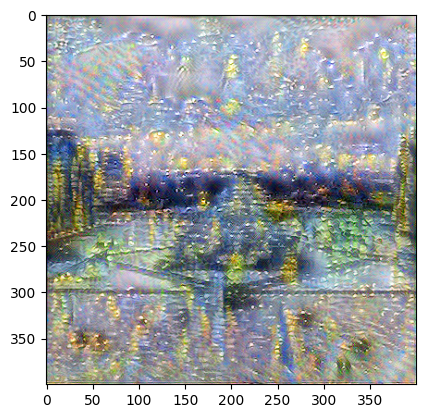

Epoch 1500 


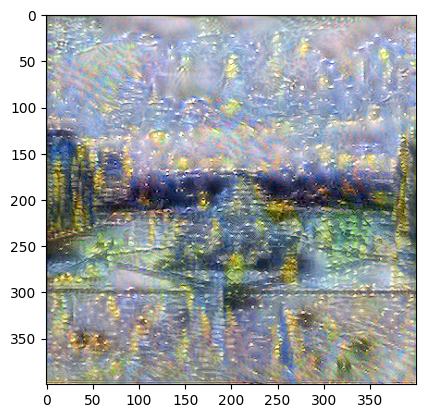

Epoch 1750 


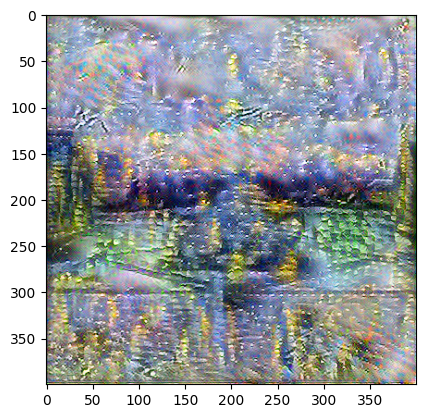

Epoch 2000 


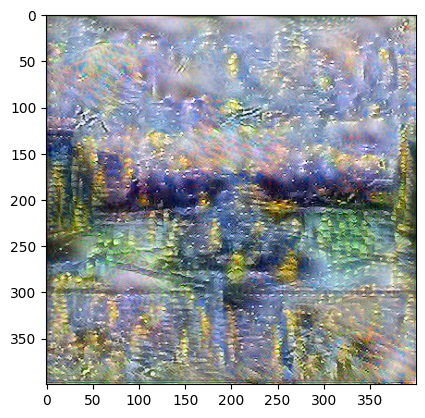

Epoch 2250 


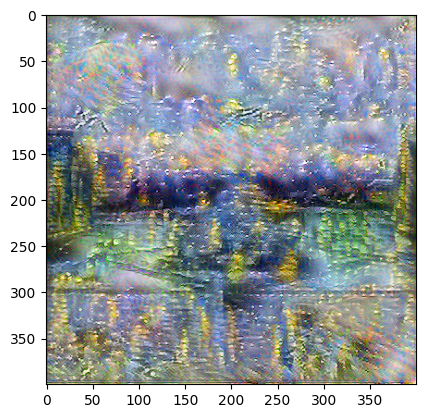

Epoch 2500 


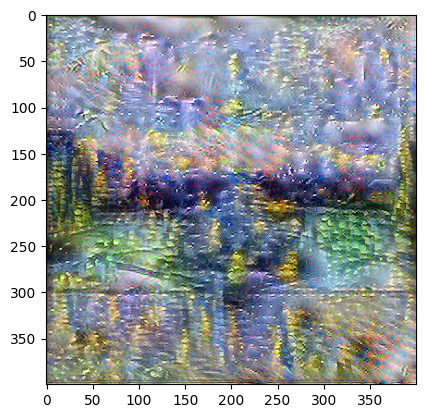

In [47]:
# Show the generated image at some epochs
epochs = 2501
for i in range(epochs):
    train_step(generated_image)
    if i % 250 == 0:
        print(f"Epoch {i} ")
    if i % 250 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        image.save(f"img/image_{i}.jpg")
        plt.show()

Run the following code cell to see the results.

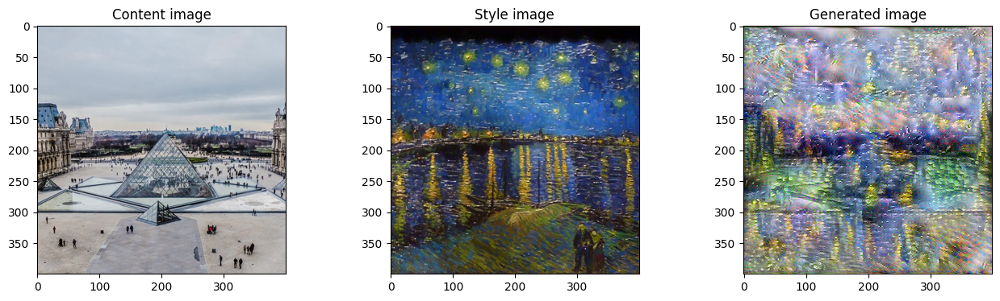

In [49]:
# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text("Content image")
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text("Style image")
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text("Generated image")
plt.show()

After running this, in the upper bar of the notebook click on "File" and the "Open". Go to the "/output" directory to see all saved images. Open "generated_image" to see it.

Running for aroung 20000 epochs with a learning rate of 0.001, the generated image will be something like the image presented below on the right.

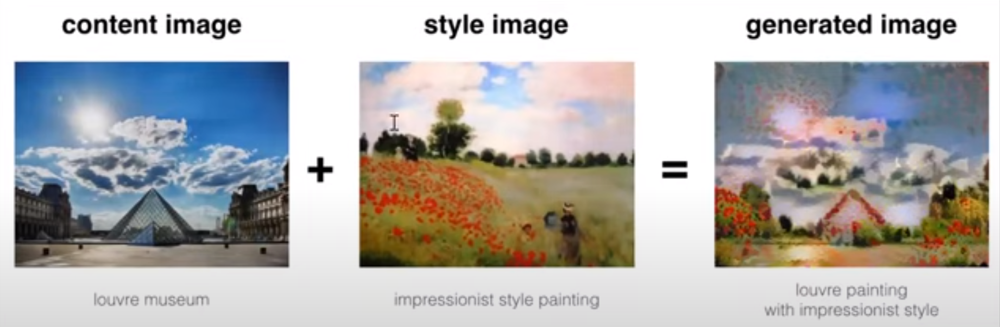

The hyperparameters were set so that the initial result appeared quite quickly. To get the best looking results, the optimization algorithm should be running for longer (and perhaps with a smaller learning rate).